# Download Annotations

In [ ]:
import os
import zipfile
import urllib.request
os.makedirs('/content/opt' , exist_ok=True)
os.chdir( '/content/opt' )
!git clone 'https://github.com/cocodataset/cocoapi.git'

fatal: destination path 'cocoapi' already exists and is not an empty directory.


In [ ]:
os.chdir('/content/opt/cocoapi')

# Download the annotation : 
annotations_trainval2014 = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip'
image_info_test2014 = 'http://images.cocodataset.org/annotations/image_info_test2014.zip'


urllib.request.urlretrieve(annotations_trainval2014 , filename = 'annotations_trainval2014.zip' )
urllib.request.urlretrieve(image_info_test2014 , filename= 'image_info_test2014.zip' )


('image_info_test2014.zip', <http.client.HTTPMessage at 0x7febbd17e278>)

In [ ]:
with zipfile.ZipFile('annotations_trainval2014.zip' , 'r') as zip_ref:
  zip_ref.extractall( '/content/opt/cocoapi'  )  

try:
  os.remove( 'annotations_trainval2014.zip' )
  print('zip removed')
except:
  None

with zipfile.ZipFile('image_info_test2014.zip' , 'r') as zip_ref:
  zip_ref.extractall( '/content/opt/cocoapi'  )  

try:
  os.remove( 'image_info_test2014.zip' )
  print('zip removed')
except:
  None

zip removed
zip removed


In [ ]:
!pip install pickle5

# Download images

In [ ]:
os.chdir('/content/opt/cocoapi')

#train2014 = 'http://images.cocodataset.org/zips/train2014.zip'
#test2014 = 'http://images.cocodataset.org/zips/test2014.zip'
val2014 = 'http://images.cocodataset.org/zips/val2014.zip'

#urllib.request.urlretrieve( train2014 , 'train2014' )
#urllib.request.urlretrieve( test2014 , 'test2014' )
urllib.request.urlretrieve( val2014 , 'val2014' )

('val2014', <http.client.HTTPMessage at 0x7febbd1b05c0>)

In [ ]:
os.chdir('/content/opt/cocoapi')
with zipfile.ZipFile( 'val2014' , 'r' ) as zip_ref:
  zip_ref.extractall( 'images' )

try:
  os.remove( 'val2014' )
  print('zip removed')
except:
  None


zip removed


# Analysis

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install pickle5

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline

import torch
import torchvision
import torch.nn as nn
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import Dataset,DataLoader
from tqdm import tqdm as tqdm
import unicodedata
import pycocotools

import re
import random 
import itertools
import time
import os 
import sys
from pycocotools.coco import COCO
import urllib
import zipfile
import json
from skimage.transform.pyramids import pyramid_expand

# from . import models
from models import Encoder, Decoder, ShowAttendTell,SpatialAttention


from dictionary import Vocabulary,EOS_token,PAD_token,SOS_token,UNK_token 

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
#Original Model Implementation Details
  # Encoder - VGG19 14×14×512 feature map of the fourth convolutional layer before max pooling. 196 × 512 
  # mini-batch - 64
  # stopping criterion - early stopping on BLEU score
  # model selection - BLEU on our validation set
  # vocabulary size - 10,000
    



#We observed a breakdown in correlation between the validation set log-likelihood and BLEU in the later stages of 
#training during our experiments

#Hyperparameters
batch_size = 64
val_batch_size = 61
feat_size = 512
feat_len = 196
embedding_size = 512
hidden_size = 512
attn_size = 256
#output_size = voc.num_words
rnn_dropout = 0.5
teacher_forcing_ratio = 0.5

In [ ]:
voc = Vocabulary('COCO_TRAIN')
voc.load()
#voc.trim(min_count=5) # remove words having frequency less than min_count
print('Vocabulary size :',voc.num_words)

Vocabulary size : 22905


In [ ]:
enc = Encoder(batch_size).to(device)
dec = Decoder(feat_size,feat_len,embedding_size,hidden_size,attn_size,voc.num_words,rnn_dropout).to(device)
model = ShowAttendTell(enc,dec,voc,teacher_forcing_ratio=teacher_forcing_ratio,batch_size=batch_size)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/rnn.py:61: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


In [ ]:
data_transform = transforms.Compose([transforms.Resize((224,224)),transforms.ToTensor()])#transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     #std=[0.229, 0.224, 0.225])])

coco_val_detection = dset.CocoDetection(root="/content/opt/cocoapi/images/val2014",annFile="/content/opt/cocoapi/annotations/instances_val2014.json")#,transform=data_transform)
coco_val = dset.CocoDetection(root="/content/opt/cocoapi/images/val2014",annFile="/content/opt/cocoapi/annotations/instances_val2014.json",transform=data_transform)


loading annotations into memory...
Done (t=8.95s)
creating index...
index created!
loading annotations into memory...
Done (t=5.13s)
creating index...
index created!


In [ ]:
coco_val_detection[265]

(<PIL.Image.Image image mode=RGB size=480x640 at 0x7F48C4479E80>, [])

In [ ]:
category_in_image = {}
count = 0 
for data in tqdm(coco_val_detection):
  _,instance = data
  cat_id = []
  image_id = []
  
  for i in range(len(instance)):
    cat_id.append(instance[i]['category_id'])
    image_id.append(instance[i]['image_id'])
  try:
    category_in_image[image_id[0]] = list(set(cat_id))
  except:
    count = count+1
category_in_image

100%|██████████| 40504/40504 [05:18<00:00, 127.07it/s]


{42: [18],
 73: [4],
 74: [1, 18, 2],
 133: [88, 65],
 136: [1, 25],
 139: [64, 1, 67, 72, 78, 82, 84, 85, 86, 62],
 143: [16],
 164: [67, 44, 46, 47, 78, 79, 82, 51, 62],
 192: [1, 39],
 196: [67, 48, 50, 51, 56, 57],
 208: [81, 90],
 241: [64, 1, 75, 44, 47, 31, 63],
 257: [1, 8, 10, 27, 31],
 283: [46, 67, 44, 62],
 285: [23],
 294: [1, 78, 48, 49, 50, 85],
 328: [32, 1, 3, 77, 15, 84, 27],
 338: [1, 79, 82, 85, 31],
 357: [40, 1, 39],
 359: [10, 3],
 360: [1, 36],
 387: [73, 77],
 395: [1, 77],
 397: [1, 67, 47, 48, 59, 62],
 400: [9, 18],
 415: [1, 43],
 428: [32, 1, 61],
 459: [32, 1],
 472: [5],
 474: [40, 1],
 486: [44, 79, 49, 82, 51],
 488: [40, 1, 37, 39],
 502: [23],
 520: [16, 1],
 536: [1, 77, 62, 31],
 544: [40, 1, 37, 39],
 564: [1, 43, 62],
 569: [1, 38],
 589: [1, 34],
 590: [81, 51],
 599: [64, 17, 75, 63],
 623: [88, 1, 62, 15],
 626: [85],
 632: [64, 65, 84, 62],
 636: [70],
 641: [1, 2, 6],
 661: [77, 54],
 675: [65, 44, 77, 47, 17],
 692: [1, 90],
 693: [1, 41],


In [ ]:
count

367

In [ ]:
def bbox_transform_coco2cv(b,wratio,hratio):
    b = [b[0]*wratio,b[1]*hratio,b[2]*wratio,b[3]*hratio]
    temp = [b[0],b[1]]
    temp.append(b[0]+b[2])
    temp.append(b[1]+b[3])
    for i in range(len(temp)):
        temp[i] = int(temp[i])
    temp2 = [temp[1],temp[0],temp[3],temp[2]]
    return np.array(temp).astype(int)#, temp2 #(x1,y1,x2,y2)

In [ ]:
bbox_dict = {}
for data in tqdm(coco_val_detection):
  image,instance= data
  original_shape = image.size
  wratio = (224*1.0)/original_shape[1]
  hratio = (224*1.0)/original_shape[0]
  for i in range(len(instance)):
    key_value = (instance[i]['image_id'],instance[i]['category_id'])
    if key_value in bbox_dict.keys():
      val = []
      for j in range(len(bbox_dict[key_value])):
        val.append(bbox_dict[key_value][j])
      val.append(bbox_transform_coco2cv(instance[i]['bbox'],hratio,wratio))
      bbox_dict[key_value] = val 
    else:
      bbox_dict[key_value] = [bbox_transform_coco2cv(instance[i]['bbox'],hratio,wratio)]
    #break

100%|██████████| 40504/40504 [05:32<00:00, 121.83it/s]


In [ ]:
bbox_dict

{(42, 18): [array([ 74,  19, 196, 133])],
 (73, 4): [array([  5,   7, 217, 221]), array([  0,   1, 107,  96])],
 (74, 18): [array([ 21, 145, 125, 199])],
 (74, 2): [array([  0,   1,  56, 166])],
 (74, 1): [array([103,  49, 109,  80]),
  array([114,  51, 119,  64]),
  array([124,  50, 130,  77]),
  array([161,  55, 172,  77]),
  array([ 96,  54, 102,  79]),
  array([ 98,  54, 103,  67])],
 (133, 65): [array([  4,   1, 224, 196])],
 (133, 88): [array([183,   9, 200,  23])],
 (136, 1): [array([  0,  68,  24, 223]), array([  0,  36,  30, 223])],
 (136, 25): [array([ 36,  69, 119, 221]), array([141,  78, 199, 177])],
 (139, 64): [array([ 82,  74,  91, 111])],
 (139, 72): [array([  2,  88,  54, 138]), array([195, 109, 223, 151])],
 (139, 62): [array([125, 114, 145, 168]),
  array([101, 114, 123, 166]),
  array([144, 117, 155, 160]),
  array([111, 115, 118, 121]),
  array([144, 115, 147, 121])],
 (139, 1): [array([144,  82, 163, 155]), array([134,  90, 139, 109])],
 (139, 78): [array([179, 10

In [ ]:
for key in bbox_dict.keys():
  if len(bbox_dict[key])>1:
    print(len(bbox_dict[key]))

Streaming output truncated to the last 5000 lines.
3
2
2
14
3
4
2
8
2
2
2
4
3
3
2
12
2
5
3
6
2
10
6
10
2
5
2
2
2
2
10
3
2
2
2
4
3
3
3
2
7
9
6
2
3
2
2
5
2
2
10
7
3
6
6
3
10
2
3
3
6
7
6
3
2
3
2
16
3
2
3
2
2
14
5
3
2
9
5
3
2
14
3
3
2
3
4
2
3
2
2
2
7
2
3
4
3
2
5
2
3
2
2
5
2
3
3
7
2
2
2
2
3
2
4
14
14
3
2
2
5
4
4
5
2
2
3
4
9
2
2
2
3
3
2
2
3
2
14
2
4
2
3
4
6
4
3
3
2
3
13
12
12
2
2
2
11
2
2
2
2
2
2
14
12
3
14
3
4
5
2
3
3
2
2
11
2
2
2
2
13
5
2
11
2
2
4
2
8
4
4
2
2
2
3
2
13
10
13
4
5
3
4
3
15
2
2
6
4
3
2
2
5
9
2
16
10
8
2
4
3
3
2
8
2
5
8
2
2
2
3
9
2
2
3
2
2
2
2
2
3
8
3
14
10
2
2
2
7
2
2
9
2
3
6
11
2
2
3
2
4
8
11
14
2
3
11
3
2
3
5
3
2
2
5
9
2
3
4
8
2
6
2
8
2
9
11
2
6
3
2
2
2
2
2
13
4
2
2
2
2
8
5
2
3
5
6
4
5
2
4
9
2
3
2
3
6
3
2
2
2
2
2
3
12
3
2
3
9
2
10
4
4
14
14
2
2
2
2
2
11
2
4
8
2
4
10
6
5
9
2
2
14
2
5
2
2
2
2
2
14
4
2
8
2
3
13
2
3
2
3
4
4
3
7
9
2
7
3
11
14
14
4
14
2
2
5
5
6
13
2
3
3
3
2
5
2
4
2
2
4
2
4
2
6
2
11
3
2
4
3
8
12
4
14
3
2
2
2
4
2
2
2
2
12
4
2
8
3
3
14
14
2
14
2
12
14
2
7
2
2
2
3
2
6

[  5   7 217 221]
4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


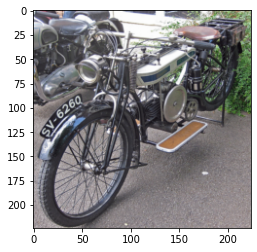

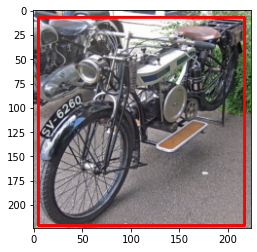

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[  0   1 107  96]
4


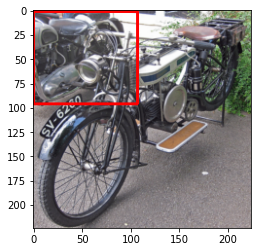

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Calculate the size and adjusted display size
img_caption,target_detection= coco_val_detection[1]
imgc,_=coco_val[1]
image_height,image_width = img_caption.size
wratio = (224*1.0)/image_width
hratio = (224*1.0)/image_height
img = np.array(torch.transpose(torch.transpose(imgc,0,2),0,1))
plt.figure()
plt.imshow(img)

for i in range(len(target_detection)):

  bbox = target_detection[i]['bbox']
  bbox_plt= bbox_transform_coco2cv(bbox,hratio,wratio)
  print(bbox_plt)
  print(target_detection[i]['category_id'])
  plt.figure()
  k = cv2.rectangle(img,(bbox_plt[0],bbox_plt[1]),(bbox_plt[2],bbox_plt[3]),(255,0,0),2)
  #plt.imshow(k)
  plt.imshow(cv2.UMat.get(k))
  plt.show()



In [ ]:
import json
with open("/content/captions_val2014_SAT_results.json") as f:
  prediction = json.load(f)

In [ ]:
prediction[0]

{'caption': 'a cat is sitting on a chair with a cat .', 'image_id': 42}

In [ ]:
class COCO14Dataset(Dataset):
    def __init__(self,coco,voc,transforms=None):
        self.coco = coco
        self.voc = voc
        self.transforms = transforms
    def __len__(self):
        return len(self.coco)
    def __getitem__(self,idx):
        img,target = self.coco[idx]
        ide = self.coco.ids[idx]

        
        return img,ide

val_dset = COCO14Dataset(coco_val,voc)

In [ ]:
def collate_fn(batch):
    data = [item[0] for item in batch]
    images = torch.stack(data,0)
    
    ides = torch.tensor([item[1] for item in batch])
    
    return images, ides



val_loader = DataLoader(val_dset,batch_size = val_batch_size, num_workers = 8,shuffle = False,collate_fn = collate_fn,
                     drop_last=False)

In [ ]:
data,ide = iter(val_loader).next()
print(data.shape) 

torch.Size([61, 3, 224, 224])


In [ ]:
model.load('/content/drive/MyDrive/Research/coco/VGG_encoder_39.pt','/content/drive/MyDrive/Research/coco/VGG_decoder_39.pt')

In [ ]:
word_association=pd.read_csv("coco_word_association.csv")
word_association.fillna(value="dummy",inplace=True)

In [ ]:
word_association.head(5)

,Category_id,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17
0,1,man,men,woman,women,child,children,kid,kids,girl,girls,boy,boys,male,female,person,dummy,dummy
1,2,bicycles,bicycle,cycles,bike,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy
2,3,car,cars,van,volkswagon,vehicles,bmw,automobile,suv,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy
3,4,motorcycle,motorcycles,bike,bikes,motorcyclist,motor,scooters,motorbikes,motorized,dummy,dummy,dummy,dummy,dummy,dummy,dummy,dummy
4,5,airplane,plane,bomber,airplanes,air crafts,jets,aircraft,jet,cargo,airliner,glider,bi-plane,dummy,dummy,dummy,dummy,dummy


In [ ]:
word_association_dict = {}
for i in tqdm(range(word_association.shape[0])):
  value = list(word_association.loc[i])
  try:
    idx = value.index("dummy")
    value = value[:idx]
    word_association_dict[value[0]] = value[1:]
  except:
    word_association_dict[value[0]] = value[1:]
  #break

100%|██████████| 80/80 [00:00<00:00, 5789.84it/s]


In [ ]:
word_association_dict

{1: ['man',
  'men',
  'woman',
  'women',
  'child',
  'children',
  'kid',
  'kids',
  'girl',
  'girls',
  'boy',
  'boys',
  'male',
  'female',
  'person'],
 2: ['bicycles', 'bicycle', 'cycles', 'bike'],
 3: ['car',
  'cars',
  'van',
  'volkswagon ',
  'vehicles',
  'bmw',
  'automobile',
  'suv'],
 4: ['motorcycle',
  'motorcycles',
  'bike',
  'bikes',
  'motorcyclist',
  'motor',
  'scooters',
  'motorbikes',
  'motorized'],
 5: ['airplane',
  'plane',
  'bomber',
  'airplanes',
  'air crafts',
  'jets',
  'aircraft',
  'jet',
  'cargo',
  'airliner',
  'glider',
  'bi-plane'],
 6: ['bus', 'school bus', 'double decker', 'busses', 'vehicles'],
 7: ['train',
  'train engine',
  'cargo train',
  'rails',
  'locomotive',
  'steam engine',
  'train car',
  'diesel train engine',
  'engine'],
 8: ['truck',
  'fire trucks',
  'tow truck',
  'trucks',
  'pickup truck',
  'trailer',
  'vehicles'],
 9: ['boat', 'canoe', 'cargo boat', 'ship', 'trawler', 'sailboats', 'rafts'],
 10: ['traf

###TOP 10 attention weights



  0%|          | 0/664 [00:00<?, ?it/s]

['a', 'motorcycle', 'parked', 'on', 'the', 'side', 'of', 'a', 'road', '.']
attention:  motorcycle ['motorcycle', 'motorcycles', 'bike', 'bikes', 'motorcyclist', 'motor', 'scooters', 'motorbikes', 'motorized'] 4
['a', 'dog', 'laying', 'on', 'the', 'ground', 'next', 'to', 'a', 'car', '.']
attention:  dog ['dog', 'dogs', 'bulldog', 'puppy', 'pup', 'animal', 'animals'] 18
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'couple', 'of', 'birds', 'standing', 'on', 'top', 'of', 'a', 'tree', '.']
attention:  birds ['bird', 'red robin', 'parrot', 'ostrich', 'swans', 'ducks', 'geese', 'owl', 'toucan', 'birds', 'swan', 'duck', 'seagull', 'duckling', 'flamingos', 'pigeons', 'seagulls'] 16
['a', 'baseball', '

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  man ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  woman ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  controller ['remote', 'remotes', 'controller'] 75


  0%|          | 0/664 [00:09<?, ?it/s]


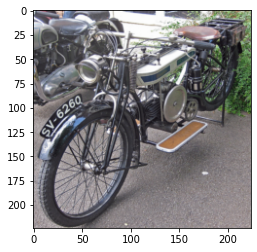

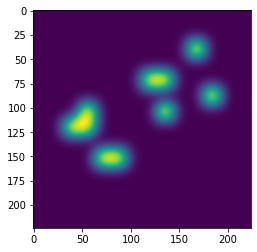

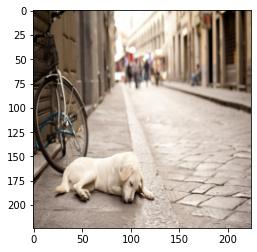

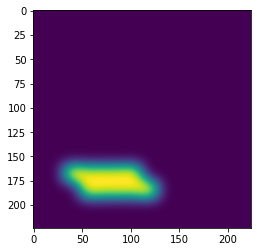

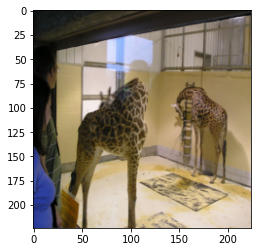

...

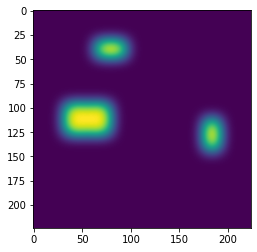

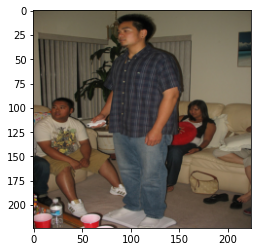

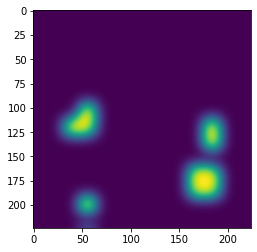

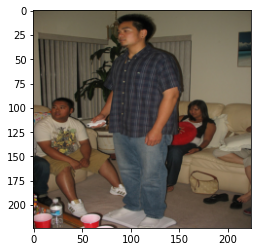

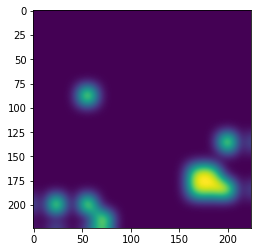

In [ ]:
result = []
ide_list = []
caption_list =[]
attn_weights = []
model.eval()
attention= {}
flag  = 0
lim = 0
with torch.no_grad():
  for data in tqdm(val_loader):
    features, ides= data
    _,cap_txt,attn_wts = model.Greedy_Decoding(features.to(device))
    ide_list += list(ides.cpu().numpy())
    caption_list += cap_txt

    for j in range(len(cap_txt)): # no of sentences in a batch
      #print(ides[j].item())
      caption = cap_txt[j].split(" ")
      # print(caption)
      #print("sfdds",ides[j])
      try:
        for cat in category_in_image[ides[j].item()]: 
          #print(cat,category_in_image[ides[j].item()])
          for k in range(len(caption)): # no of words in a sentence
            if caption[k] in word_association_dict[cat]:
              #print("dsd",caption[k],word_association_dict[cat],cat)
              #print(np.shape(attn_wts))
              focus_weights = attn_wts[k,j] # 196 dimensional attention vector
              bbox_data = bbox_dict[(ides[j].item(),cat)]
              #print("bbox data",bbox_data)
              original_box = np.zeros((224,224),dtype=np.uint8)
              attn_box = np.zeros(196,dtype=np.uint8)
              max_attn,indices = torch.topk(torch.Tensor(focus_weights),10)
              #print(max_attn,indices)
              attn_box[indices.numpy()] = 1
              attn_box = np.reshape(attn_box,(14,14))
              attn_box_4 = pyramid_expand(attn_box,upscale=16,order=3)
              #print("pyramid expand",attn_box_4.shape)

              image_gt = np.zeros((224,224),dtype=np.uint8)
              # for m in range(len(bbox_data)):
              #   image_gt[bbox_data[m][1]:bbox_data[m][3],bbox_data[m][0]:bbox_data[m][2]] =1.0
              
              # attention[(ides[j].item(),caption[k])] = np.sum(np.multiply(image_gt,attn_box_4))

              #attn_box_1= scipy.ndimage.zoom(attn_box,16,order=1)
              #attn_box_2= scipy.ndimage.zoom(attn_box,16,order=2)
              #attn_box_3= scipy.ndimage.zoom(attn_box,16,order=3)
              # print("attn_box",attn_box.shape)
              plt.figure()
              plt.imshow(torch.transpose(torch.transpose(features[j],0,2),0,1))
              plt.figure()
              print(caption)
              plt.imshow(attn_box_4)
              print("attention: ",caption[k],word_association_dict[cat],cat)
              # plt.imshow(image_gt)
      except:
        flag= flag +1  
      if lim > 10:
        break
      lim += 1
    break          
  #for a in zip(ide_list,caption_list):
  #  result.append({'image_id':a[0].item(),'caption':a[1].strip()}) 

###TOP 20 attention weights

  0%|          | 0/664 [00:00<?, ?it/s]

['a', 'motorcycle', 'parked', 'on', 'the', 'side', 'of', 'a', 'road', '.']
attention:  motorcycle ['motorcycle', 'motorcycles', 'bike', 'bikes', 'motorcyclist', 'motor', 'scooters', 'motorbikes', 'motorized'] 4
['a', 'dog', 'laying', 'on', 'the', 'ground', 'next', 'to', 'a', 'car', '.']
attention:  dog ['dog', 'dogs', 'bulldog', 'puppy', 'pup', 'animal', 'animals'] 18
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'couple', 'of', 'birds', 'standing', 'on', 'top', 'of', 'a', 'tree', '.']
attention:  birds ['bird', 'red robin', 'parrot', 'ostrich', 'swans', 'ducks', 'geese', 'owl', 'toucan', 'birds', 'swan', 'duck', 'seagull', 'duckling', 'flamingos', 'pigeons', 'seagulls'] 16
['a', 'baseball', '

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  man ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  woman ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  controller ['remote', 'remotes', 'controller'] 75


  0%|          | 0/664 [00:09<?, ?it/s]


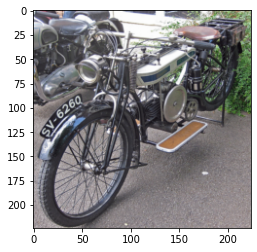

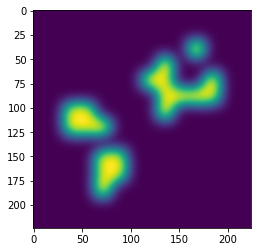

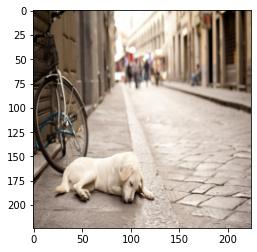

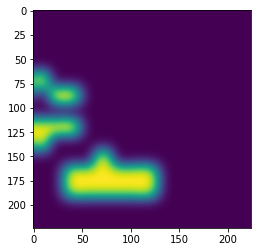

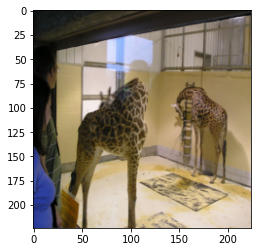

...

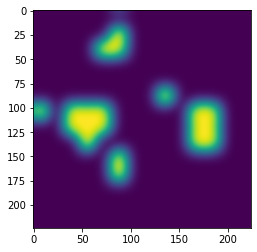

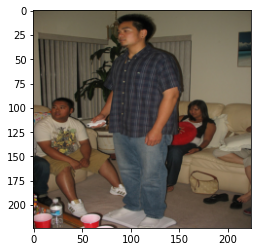

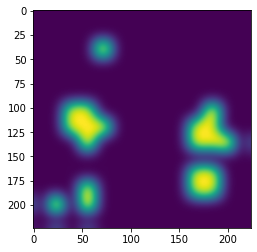

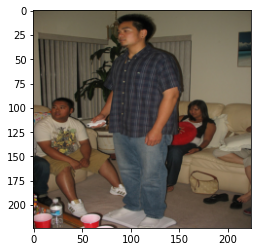

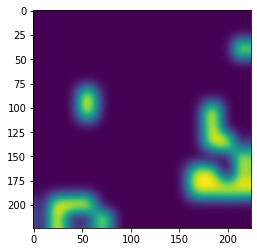

In [ ]:
result = []
ide_list = []
caption_list =[]
attn_weights = []
model.eval()
attention= {}
flag  = 0
lim = 0
with torch.no_grad():
  for data in tqdm(val_loader):
    features, ides= data
    _,cap_txt,attn_wts = model.Greedy_Decoding(features.to(device))
    ide_list += list(ides.cpu().numpy())
    caption_list += cap_txt

    for j in range(len(cap_txt)): # no of sentences in a batch
      #print(ides[j].item())
      caption = cap_txt[j].split(" ")
      # print(caption)
      #print("sfdds",ides[j])
      try:
        for cat in category_in_image[ides[j].item()]: 
          #print(cat,category_in_image[ides[j].item()])
          for k in range(len(caption)): # no of words in a sentence
            if caption[k] in word_association_dict[cat]:
              #print("dsd",caption[k],word_association_dict[cat],cat)
              #print(np.shape(attn_wts))
              focus_weights = attn_wts[k,j] # 196 dimensional attention vector
              bbox_data = bbox_dict[(ides[j].item(),cat)]
              #print("bbox data",bbox_data)
              original_box = np.zeros((224,224),dtype=np.uint8)
              attn_box = np.zeros(196,dtype=np.uint8)
              max_attn,indices = torch.topk(torch.Tensor(focus_weights),20)
              #print(max_attn,indices)
              attn_box[indices.numpy()] = 1
              attn_box = np.reshape(attn_box,(14,14))
              attn_box_4 = pyramid_expand(attn_box,upscale=16,order=3)
              #print("pyramid expand",attn_box_4.shape)

              image_gt = np.zeros((224,224),dtype=np.uint8)
              # for m in range(len(bbox_data)):
              #   image_gt[bbox_data[m][1]:bbox_data[m][3],bbox_data[m][0]:bbox_data[m][2]] =1.0
              
              # attention[(ides[j].item(),caption[k])] = np.sum(np.multiply(image_gt,attn_box_4))

              #attn_box_1= scipy.ndimage.zoom(attn_box,16,order=1)
              #attn_box_2= scipy.ndimage.zoom(attn_box,16,order=2)
              #attn_box_3= scipy.ndimage.zoom(attn_box,16,order=3)
              # print("attn_box",attn_box.shape)
              plt.figure()
              plt.imshow(torch.transpose(torch.transpose(features[j],0,2),0,1))
              plt.figure()
              print(caption)
              plt.imshow(attn_box_4)
              print("attention: ",caption[k],word_association_dict[cat],cat)
              # plt.imshow(image_gt)
      except:
        flag= flag +1  
      if lim > 10:
        break
      lim += 1
    break          
  #for a in zip(ide_list,caption_list):
  #  result.append({'image_id':a[0].item(),'caption':a[1].strip()}) 

###TOP 50 attention weights



  0%|          | 0/664 [00:00<?, ?it/s]

['a', 'motorcycle', 'parked', 'on', 'the', 'side', 'of', 'a', 'road', '.']
attention:  motorcycle ['motorcycle', 'motorcycles', 'bike', 'bikes', 'motorcyclist', 'motor', 'scooters', 'motorbikes', 'motorized'] 4
['a', 'dog', 'laying', 'on', 'the', 'ground', 'next', 'to', 'a', 'car', '.']
attention:  dog ['dog', 'dogs', 'bulldog', 'puppy', 'pup', 'animal', 'animals'] 18
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'couple', 'of', 'birds', 'standing', 'on', 'top', 'of', 'a', 'tree', '.']
attention:  birds ['bird', 'red robin', 'parrot', 'ostrich', 'swans', 'ducks', 'geese', 'owl', 'toucan', 'birds', 'swan', 'duck', 'seagull', 'duckling', 'flamingos', 'pigeons', 'seagulls'] 16
['a', 'baseball', '

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  man ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  woman ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  controller ['remote', 'remotes', 'controller'] 75


  0%|          | 0/664 [00:09<?, ?it/s]


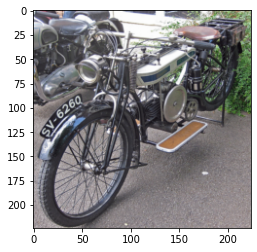

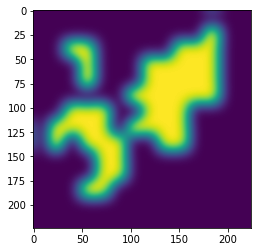

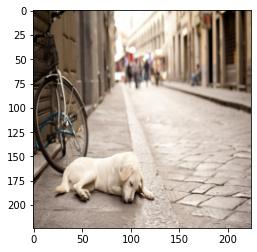

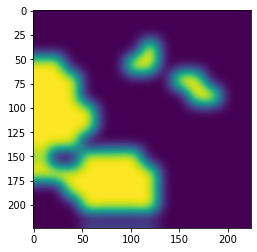

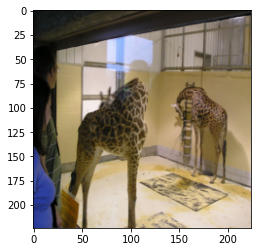

...

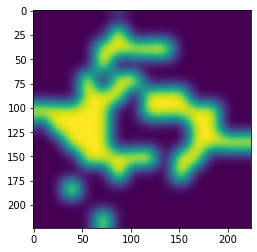

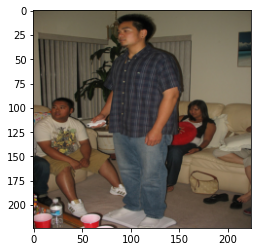

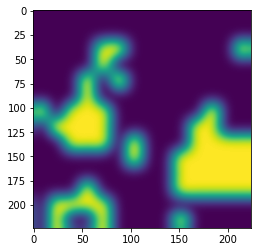

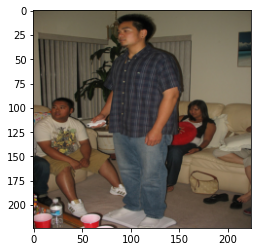

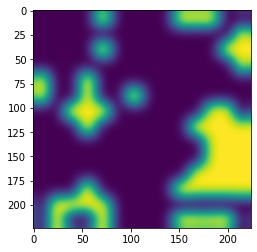

In [ ]:
result = []
ide_list = []
caption_list =[]
attn_weights = []
model.eval()
attention= {}
flag  = 0
lim = 0
with torch.no_grad():
  for data in tqdm(val_loader):
    features, ides= data
    _,cap_txt,attn_wts = model.Greedy_Decoding(features.to(device))
    ide_list += list(ides.cpu().numpy())
    caption_list += cap_txt

    for j in range(len(cap_txt)): # no of sentences in a batch
      #print(ides[j].item())
      caption = cap_txt[j].split(" ")
      # print(caption)
      #print("sfdds",ides[j])
      try:
        for cat in category_in_image[ides[j].item()]: 
          #print(cat,category_in_image[ides[j].item()])
          for k in range(len(caption)): # no of words in a sentence
            if caption[k] in word_association_dict[cat]:
              #print("dsd",caption[k],word_association_dict[cat],cat)
              #print(np.shape(attn_wts))
              focus_weights = attn_wts[k,j] # 196 dimensional attention vector
              bbox_data = bbox_dict[(ides[j].item(),cat)]
              #print("bbox data",bbox_data)
              original_box = np.zeros((224,224),dtype=np.uint8)
              attn_box = np.zeros(196,dtype=np.uint8)
              max_attn,indices = torch.topk(torch.Tensor(focus_weights),50)
              #print(max_attn,indices)
              attn_box[indices.numpy()] = 1
              attn_box = np.reshape(attn_box,(14,14))
              attn_box_4 = pyramid_expand(attn_box,upscale=16,order=3)
              #print("pyramid expand",attn_box_4.shape)

              image_gt = np.zeros((224,224),dtype=np.uint8)
              # for m in range(len(bbox_data)):
              #   image_gt[bbox_data[m][1]:bbox_data[m][3],bbox_data[m][0]:bbox_data[m][2]] =1.0
              
              # attention[(ides[j].item(),caption[k])] = np.sum(np.multiply(image_gt,attn_box_4))

              #attn_box_1= scipy.ndimage.zoom(attn_box,16,order=1)
              #attn_box_2= scipy.ndimage.zoom(attn_box,16,order=2)
              #attn_box_3= scipy.ndimage.zoom(attn_box,16,order=3)
              # print("attn_box",attn_box.shape)
              plt.figure()
              plt.imshow(torch.transpose(torch.transpose(features[j],0,2),0,1))
              plt.figure()
              print(caption)
              plt.imshow(attn_box_4)
              print("attention: ",caption[k],word_association_dict[cat],cat)
              # plt.imshow(image_gt)
      except:
        flag= flag +1  
      if lim > 10:
        break
      lim += 1
    break          
  #for a in zip(ide_list,caption_list):
  #  result.append({'image_id':a[0].item(),'caption':a[1].strip()}) 

###TOP 100 attention weights



  0%|          | 0/664 [00:00<?, ?it/s]

['a', 'motorcycle', 'parked', 'on', 'the', 'side', 'of', 'a', 'road', '.']
attention:  motorcycle ['motorcycle', 'motorcycles', 'bike', 'bikes', 'motorcyclist', 'motor', 'scooters', 'motorbikes', 'motorized'] 4
['a', 'dog', 'laying', 'on', 'the', 'ground', 'next', 'to', 'a', 'car', '.']
attention:  dog ['dog', 'dogs', 'bulldog', 'puppy', 'pup', 'animal', 'animals'] 18
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
attention:  giraffe ['giraffe', 'giraffes', 'animal', 'animals'] 25
['a', 'couple', 'of', 'birds', 'standing', 'on', 'top', 'of', 'a', 'tree', '.']
attention:  birds ['bird', 'red robin', 'parrot', 'ostrich', 'swans', 'ducks', 'geese', 'owl', 'toucan', 'birds', 'swan', 'duck', 'seagull', 'duckling', 'flamingos', 'pigeons', 'seagulls'] 16
['a', 'baseball', '

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  man ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  woman ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
attention:  controller ['remote', 'remotes', 'controller'] 75


  0%|          | 0/664 [00:09<?, ?it/s]


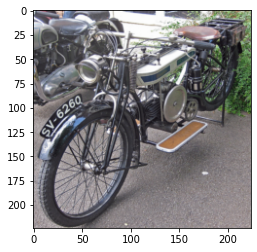

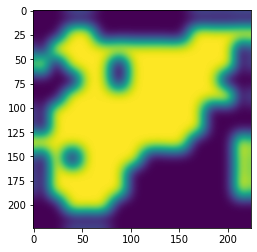

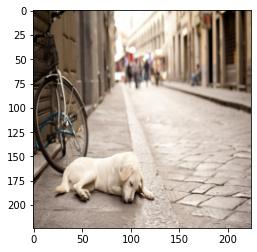

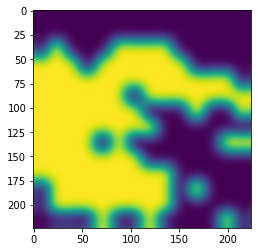

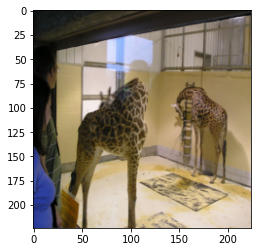

...

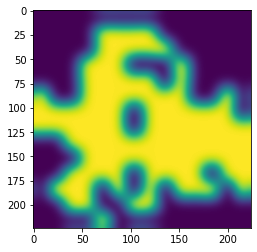

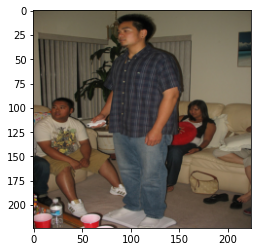

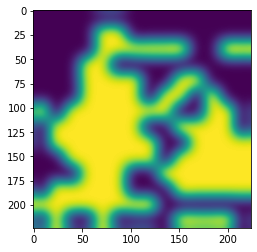

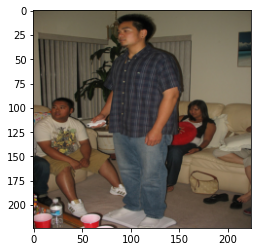

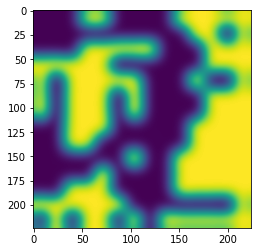

In [ ]:
result = []
ide_list = []
caption_list =[]
attn_weights = []
model.eval()
attention= {}
flag  = 0
lim = 0
with torch.no_grad():
  for data in tqdm(val_loader):
    features, ides= data
    _,cap_txt,attn_wts = model.Greedy_Decoding(features.to(device))
    ide_list += list(ides.cpu().numpy())
    caption_list += cap_txt

    for j in range(len(cap_txt)): # no of sentences in a batch
      #print(ides[j].item())
      caption = cap_txt[j].split(" ")
      # print(caption)
      #print("sfdds",ides[j])
      try:
        for cat in category_in_image[ides[j].item()]: 
          #print(cat,category_in_image[ides[j].item()])
          for k in range(len(caption)): # no of words in a sentence
            if caption[k] in word_association_dict[cat]:
              #print("dsd",caption[k],word_association_dict[cat],cat)
              #print(np.shape(attn_wts))
              focus_weights = attn_wts[k,j] # 196 dimensional attention vector
              bbox_data = bbox_dict[(ides[j].item(),cat)]
              #print("bbox data",bbox_data)
              original_box = np.zeros((224,224),dtype=np.uint8)
              attn_box = np.zeros(196,dtype=np.uint8)
              max_attn,indices = torch.topk(torch.Tensor(focus_weights),100)
              #print(max_attn,indices)
              attn_box[indices.numpy()] = 1
              attn_box = np.reshape(attn_box,(14,14))
              attn_box_4 = pyramid_expand(attn_box,upscale=16,order=3)
              #print("pyramid expand",attn_box_4.shape)

              image_gt = np.zeros((224,224),dtype=np.uint8)
              # for m in range(len(bbox_data)):
              #   image_gt[bbox_data[m][1]:bbox_data[m][3],bbox_data[m][0]:bbox_data[m][2]] =1.0
              
              # attention[(ides[j].item(),caption[k])] = np.sum(np.multiply(image_gt,attn_box_4))

              #attn_box_1= scipy.ndimage.zoom(attn_box,16,order=1)
              #attn_box_2= scipy.ndimage.zoom(attn_box,16,order=2)
              #attn_box_3= scipy.ndimage.zoom(attn_box,16,order=3)
              # print("attn_box",attn_box.shape)
              plt.figure()
              plt.imshow(torch.transpose(torch.transpose(features[j],0,2),0,1))
              plt.figure()
              print(caption)
              plt.imshow(attn_box_4)
              print("attention: ",caption[k],word_association_dict[cat],cat)
              # plt.imshow(image_gt)
      except:
        flag= flag +1  
      if lim > 10:
        break
      lim += 1
    break          
  #for a in zip(ide_list,caption_list):
  #  result.append({'image_id':a[0].item(),'caption':a[1].strip()}) 

## visualisation of quantification

  0%|          | 0/664 [00:00<?, ?it/s]

--------------------------------------------------
caption ['a', 'motorcycle', 'parked', 'on', 'the', 'side', 'of', 'a', 'road', '.']
bbox_data:  [array([  5,   7, 217, 221]), array([  0,   1, 107,  96])]
area_of_true_bbox:  46455
area_of_pred_bbox:  34209
percentage attention:  0.7363900548918308
attention:  11.178432966314766
quantified attention:  0.0003267687733144718
limit:  1
attention:  motorcycle ['motorcycle', 'motorcycles', 'bike', 'bikes', 'motorcyclist', 'motor', 'scooters', 'motorbikes', 'motorized'] 4
--------------------------------------------------
caption ['a', 'dog', 'laying', 'on', 'the', 'ground', 'next', 'to', 'a', 'car', '.']
bbox_data:  [array([ 21, 145, 125, 199])]
area_of_true_bbox:  5616
area_of_pred_bbox:  5616
percentage attention:  1.0
attention:  9.821636506696043
quantified attention:  0.0017488668993404636
limit:  2
attention:  dog ['dog', 'dogs', 'bulldog', 'puppy', 'pup', 'animal', 'animals'] 18
--------------------------------------------------
capti

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:61: RuntimeWarning: invalid value encountered in double_scalars


--------------------------------------------------
caption ['a', 'table', 'topped', 'with', 'plates', 'of', 'food', 'and', 'bowls', '.']
bbox_data:  [array([  0,  19, 224, 224])]
area_of_true_bbox:  45920
area_of_pred_bbox:  28416
percentage attention:  0.6188153310104529
attention:  10.821428603105534
quantified attention:  0.00038082167099892785
limit:  9
attention:  table ['dining table', 'table', 'tables', 'furniture', 'furnitures', ' dinner table'] 67
--------------------------------------------------
caption ['a', 'table', 'topped', 'with', 'plates', 'of', 'food', 'and', 'bowls', '.']
bbox_data:  [array([ 96,  27, 141,  56]), array([148, 110, 199, 163]), array([179, 147, 223, 213]), array([ 82,  92, 141, 132]), array([127, 157, 183, 222]), array([116,  73, 162, 105]), array([119,  54, 172,  84]), array([66, 33, 97, 49]), array([126,  22, 159,  51]), array([40, 41, 73, 59]), array([11, 51, 52, 79]), array([  0,  68,  24, 102]), array([  0,  88,  60, 131])]
area_of_true_bbox:  1998

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


--------------------------------------------------
caption ['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
bbox_data:  [array([ 61,   2, 155, 221]), array([  0,  92,  96, 214]), array([137,  92, 188, 182]), array([  0, 130,  21, 201]), array([184, 118, 224, 198])]
area_of_true_bbox:  33942
area_of_pred_bbox:  26031
percentage attention:  0.7669259324730422
attention:  9.532955405386737
quantified attention:  0.0003662154894313218
limit:  11
attention:  woman ['man', 'men', 'woman', 'women', 'child', 'children', 'kid', 'kids', 'girl', 'girls', 'boy', 'boys', 'male', 'female', 'person'] 1
--------------------------------------------------
caption ['a', 'man', 'and', 'a', 'woman', 'playing', 'a', 'game', 'with', 'a', 'wii', 'controller', '.']
bbox_data:  [array([ 54, 112,  75, 120])]
area_of_true_bbox:  168
area_of_pred_bbox:  168
percentage attention:  1.0
attention:  0.0008486915127184779
quantified attention:  5.051735194752844e-06
limit

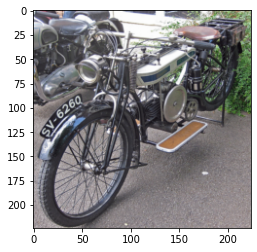

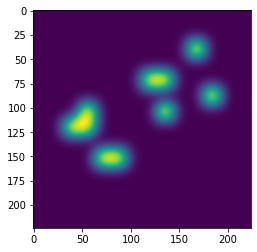

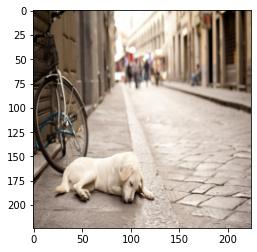

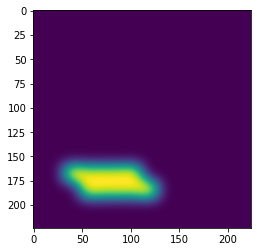

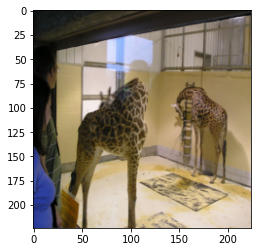

...

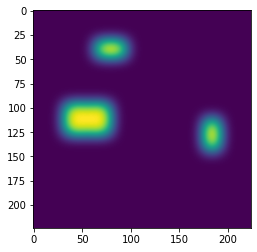

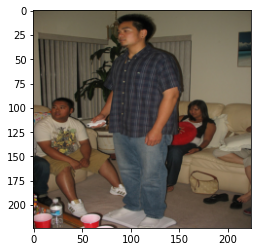

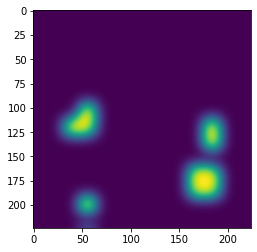

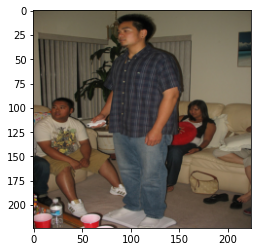

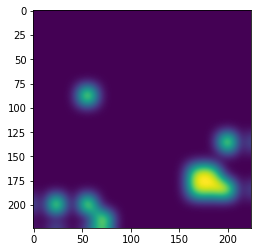

In [ ]:
result = []
ide_list = []
caption_list =[]
attn_weights = []
model.eval()
attention= {}
flag  = 0
lim = 0
with torch.no_grad():
  for data in tqdm(val_loader):
    features, ides= data
    _,cap_txt,attn_wts = model.Greedy_Decoding(features.to(device))
    ide_list += list(ides.cpu().numpy())
    caption_list += cap_txt

    for j in range(len(cap_txt)): # no of sentences in a batch
      #print(ides[j].item())
      caption = cap_txt[j].split(" ")
      # print(caption)
      #print("sfdds",ides[j])
      try:
        for cat in category_in_image[ides[j].item()]: 
          #print(cat,category_in_image[ides[j].item()])
          for k in range(len(caption)): # no of words in a sentence
            if caption[k] in word_association_dict[cat]:
              #print("dsd",caption[k],word_association_dict[cat],cat)
              #print(np.shape(attn_wts))
              focus_weights = attn_wts[k,j] # 196 dimensional attention vector
              bbox_data = bbox_dict[(ides[j].item(),cat)]
              #print("bbox data",bbox_data)
              original_box = np.zeros((224,224),dtype=np.uint8)
              attn_box = np.zeros(196,dtype=np.uint8)
              max_attn,indices = torch.topk(torch.Tensor(focus_weights),10)
              #print(max_attn,indices)
              attn_box[indices.numpy()] = 1
              attn_box = np.reshape(attn_box,(14,14))
              attn_box_4 = pyramid_expand(attn_box,upscale=16,order=3)
              #print("pyramid expand",attn_box_4.shape)

              image_gt = np.zeros((224,224),dtype=np.uint8)
              for m in range(len(bbox_data)):
                image_gt[bbox_data[m][1]:bbox_data[m][3],bbox_data[m][0]:bbox_data[m][2]] =1.0

              area_of_true_bbox = 0
              area_of_pred_bbox = 0
              for row in range(224):
                for col in range(224):
                    if(image_gt[row][col]):
                      area_of_true_bbox +=1;
                    if(attn_box_4[row][col] and image_gt[row][col]):
                      area_of_pred_bbox +=1;
                      
              print("-"*50)
              print("caption", caption)
              print("bbox_data: ", bbox_data)
              print("area_of_true_bbox: ", area_of_true_bbox)
              print("area_of_pred_bbox: ", area_of_pred_bbox)
              print("percentage attention: ", area_of_pred_bbox/area_of_true_bbox)
              attention[(ides[j].item(),caption[k])] = np.sum(np.multiply(image_gt,attn_box_4))
              print("attention: ", attention[(ides[j].item(),caption[k])])
              print("quantified attention: ", attention[(ides[j].item(),caption[k])]/area_of_pred_bbox)
              # print("attn_box",attn_box.shape)
              plt.figure()
              plt.imshow(torch.transpose(torch.transpose(features[j],0,2),0,1))
              plt.figure()
              # print(caption)
              plt.imshow(attn_box_4)
              print("limit: ", lim)
              print("attention: ",caption[k],word_association_dict[cat],cat)
              # plt.imshow(image_gt)
      except:
        flag= flag +1  
      if lim > 10:
        break
      lim += 1
    break          
  #for a in zip(ide_list,caption_list):
  #  result.append({'image_id':a[0].item(),'caption':a[1].strip()}) 

#on few images

In [ ]:
result = []
ide_list = []
caption_list =[]
attn_weights = []
model.eval()
attention= {}
flag  = 0
lim = 0
area_of_true_bbox_dict = {}
area_of_pred_bbox_dict = {}
attention_dict = {}
with torch.no_grad():
  for data in tqdm(val_loader):
    features, ides= data
    _,cap_txt,attn_wts = model.Greedy_Decoding(features.to(device))
    ide_list += list(ides.cpu().numpy())
    caption_list += cap_txt

    for j in range(len(cap_txt)): # no of sentences in a batch
      #print(ides[j].item())
      caption = cap_txt[j].split(" ")
      # print(caption)
      #print("sfdds",ides[j])
      try:
        for cat in category_in_image[ides[j].item()]: 
          #print(cat,category_in_image[ides[j].item()])
          for k in range(len(caption)): # no of words in a sentence
            if caption[k] in word_association_dict[cat]:
              #print("dsd",caption[k],word_association_dict[cat],cat)
              #print(np.shape(attn_wts))
              focus_weights = attn_wts[k,j] # 196 dimensional attention vector
              bbox_data = bbox_dict[(ides[j].item(),cat)]
              #print("bbox data",bbox_data)
              original_box = np.zeros((224,224),dtype=np.uint8)
              attn_box = np.zeros(196,dtype=np.uint8)
              max_attn,indices = torch.topk(torch.Tensor(focus_weights),10)
              #print(max_attn,indices)
              attn_box[indices.numpy()] = 1
              attn_box = np.reshape(attn_box,(14,14))
              attn_box_4 = pyramid_expand(attn_box,upscale=16,order=3)
              #print("pyramid expand",attn_box_4.shape)

              image_gt = np.zeros((224,224),dtype=np.uint8)
              for m in range(len(bbox_data)):
                image_gt[bbox_data[m][1]:bbox_data[m][3],bbox_data[m][0]:bbox_data[m][2]] =1.0

              area_of_true_bbox = 0
              area_of_pred_bbox = 0
              for row in range(224):
                for col in range(224):
                    if(image_gt[row][col]):
                      area_of_true_bbox +=1;
                    if(attn_box_4[row][col] and image_gt[row][col]):
                      area_of_pred_bbox +=1;
                      
              area_of_true_bbox_dict[(ides[j].item(),cat)] = area_of_true_bbox
              area_of_pred_bbox_dict[(ides[j].item(),cat)] = area_of_pred_bbox
              print("-"*50)
              print("caption", caption)
              print("bbox_data: ", bbox_data)
              print("area_of_true_bbox: ", area_of_true_bbox)
              print("area_of_pred_bbox: ", area_of_pred_bbox)
              print("percentage attention: ", area_of_pred_bbox/area_of_true_bbox)
              attention[(ides[j].item(),caption[k])] = np.sum(np.multiply(image_gt,attn_box_4))
              attention_dict[  (ides[j].item(),cat) ] = np.sum(np.multiply(image_gt,attn_box_4))
              print("attention: ", attention[(ides[j].item(),caption[k])])
              print("quantified attention: ", attention[(ides[j].item(),caption[k])]/area_of_pred_bbox)
              # print("attn_box",attn_box.shape)
              # plt.figure()
              # plt.imshow(torch.transpose(torch.transpose(features[j],0,2),0,1))
              # plt.figure()
              # # print(caption)
              # plt.imshow(attn_box_4)
              # print("limit: ", lim)
              # print("attention: ",caption[k],word_association_dict[cat],cat)
              # plt.imshow(image_gt)
      except:
        flag= flag +1  
      if lim > 10:
        break
      lim += 1
    break          
  #for a in zip(ide_list,caption_list):
  #  result.append({'image_id':a[0].item(),'caption':a[1].strip()}) 


  0%|          | 0/664 [00:00<?, ?it/s]

--------------------------------------------------
caption ['a', 'motorcycle', 'parked', 'on', 'the', 'side', 'of', 'a', 'road', '.']
bbox_data:  [array([  5,   7, 217, 221]), array([  0,   1, 107,  96])]
area_of_true_bbox:  46455
area_of_pred_bbox:  34209
percentage attention:  0.7363900548918308
attention:  11.178432966314766
quantified attention:  0.0003267687733144718
--------------------------------------------------
caption ['a', 'dog', 'laying', 'on', 'the', 'ground', 'next', 'to', 'a', 'car', '.']
bbox_data:  [array([ 21, 145, 125, 199])]
area_of_true_bbox:  5616
area_of_pred_bbox:  5616
percentage attention:  1.0
attention:  9.821636506696043
quantified attention:  0.0017488668993404636
--------------------------------------------------
caption ['a', 'giraffe', 'standing', 'next', 'to', 'a', 'building', 'with', 'a', 'giraffe', 'in', 'it', '.']
bbox_data:  [array([ 36,  69, 119, 221]), array([141,  78, 199, 177])]
area_of_true_bbox:  18358
area_of_pred_bbox:  15374
percentage a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in double_scalars


--------------------------------------------------
caption ['a', 'table', 'topped', 'with', 'plates', 'of', 'food', 'and', 'bowls', '.']
bbox_data:  [array([  0,  19, 224, 224])]
area_of_true_bbox:  45920
area_of_pred_bbox:  28416
percentage attention:  0.6188153310104529
attention:  10.821428603105534
quantified attention:  0.00038082167099892785
--------------------------------------------------
caption ['a', 'table', 'topped', 'with', 'plates', 'of', 'food', 'and', 'bowls', '.']
bbox_data:  [array([ 96,  27, 141,  56]), array([148, 110, 199, 163]), array([179, 147, 223, 213]), array([ 82,  92, 141, 132]), array([127, 157, 183, 222]), array([116,  73, 162, 105]), array([119,  54, 172,  84]), array([66, 33, 97, 49]), array([126,  22, 159,  51]), array([40, 41, 73, 59]), array([11, 51, 52, 79]), array([  0,  68,  24, 102]), array([  0,  88,  60, 131])]
area_of_true_bbox:  19986
area_of_pred_bbox:  12977
percentage attention:  0.6493045131592114
attention:  1.275788445274964
quantified 

In [ ]:
area_of_true_bbox_dict

{(73, 4): 46455,
 (74, 18): 5616,
 (136, 25): 18358,
 (143, 16): 18663,
 (192, 39): 572,
 (196, 51): 19986,
 (196, 56): 781,
 (196, 57): 1428,
 (196, 67): 45920,
 (241, 1): 33942,
 (241, 75): 168}

In [ ]:
area_of_pred_bbox_dict

{(73, 4): 34209,
 (74, 18): 5616,
 (136, 25): 7534,
 (143, 16): 16857,
 (192, 39): 0,
 (196, 51): 12977,
 (196, 56): 737,
 (196, 57): 1225,
 (196, 67): 28416,
 (241, 1): 26031,
 (241, 75): 168}

In [ ]:
attention_dict 

{(73, 4): 11.178432966314766,
 (74, 18): 9.821636506696043,
 (136, 25): 7.790929944125885,
 (143, 16): 9.635777535989437,
 (192, 39): 0.0,
 (196, 51): 1.275788445274964,
 (196, 56): 0.021737474566158307,
 (196, 57): 0.8783912407439879,
 (196, 67): 10.821428603105534,
 (241, 1): 9.532955405386737,
 (241, 75): 0.0008486915127184779}

In [ ]:
attention

{(73, 'motorcycle'): 11.178432966314766,
 (74, 'dog'): 9.821636506696043,
 (136, 'giraffe'): 7.790929944125885,
 (143, 'birds'): 9.635777535989437,
 (192, 'bat'): 0.0,
 (196, 'bowls'): 1.275788445274964,
 (196, 'food'): 0.8783912407439879,
 (196, 'table'): 10.821428603105534,
 (241, 'controller'): 0.0008486915127184779,
 (241, 'man'): 10.294925821266535,
 (241, 'woman'): 9.532955405386737}

In [36]:
result = []
ide_list = []
caption_list =[]
attn_weights = []
model.eval()
attention= {}
flag  = 0
# lim = 0
area_of_true_bbox_dict = {}
area_of_pred_bbox_dict = {}
attention_dict = {}
with torch.no_grad():
  for data in tqdm(val_loader):
    features, ides= data
    _,cap_txt,attn_wts = model.Greedy_Decoding(features.to(device))
    ide_list += list(ides.cpu().numpy())
    caption_list += cap_txt

    for j in range(len(cap_txt)): # no of sentences in a batch
      #print(ides[j].item())
      caption = cap_txt[j].split(" ")
      # print(caption)
      #print("sfdds",ides[j])
      try:
        for cat in category_in_image[ides[j].item()]: 
          #print(cat,category_in_image[ides[j].item()])
          for k in range(len(caption)): # no of words in a sentence
            if caption[k] in word_association_dict[cat]:
              #print("dsd",caption[k],word_association_dict[cat],cat)
              #print(np.shape(attn_wts))
              focus_weights = attn_wts[k,j] # 196 dimensional attention vector
              bbox_data = bbox_dict[(ides[j].item(),cat)]
              #print("bbox data",bbox_data)
              original_box = np.zeros((224,224),dtype=np.uint8)
              attn_box = np.zeros(196,dtype=np.uint8)
              max_attn,indices = torch.topk(torch.Tensor(focus_weights),10)
              #print(max_attn,indices)
              attn_box[indices.numpy()] = 1
              attn_box = np.reshape(attn_box,(14,14))
              attn_box_4 = pyramid_expand(attn_box,upscale=16,order=3)
              #print("pyramid expand",attn_box_4.shape)

              image_gt = np.zeros((224,224),dtype=np.uint8)
              for m in range(len(bbox_data)):
                image_gt[bbox_data[m][1]:bbox_data[m][3],bbox_data[m][0]:bbox_data[m][2]] =1.0

              area_of_true_bbox = 0
              area_of_pred_bbox = 0
              for row in range(224):
                for col in range(224):
                    if(image_gt[row][col]):
                      area_of_true_bbox +=1;
                    if(attn_box_4[row][col] and image_gt[row][col]):
                      area_of_pred_bbox +=1;
                      
              area_of_true_bbox_dict[(ides[j].item(),cat)] = area_of_true_bbox
              area_of_pred_bbox_dict[(ides[j].item(),cat)] = area_of_pred_bbox
              # print("-"*50)
              # print("caption", caption)
              # print("bbox_data: ", bbox_data)
              # print("area_of_true_bbox: ", area_of_true_bbox)
              # print("area_of_pred_bbox: ", area_of_pred_bbox)
              # print("percentage attention: ", area_of_pred_bbox/area_of_true_bbox)
              attention[(ides[j].item(),caption[k])] = np.sum(np.multiply(image_gt,attn_box_4))
              attention_dict[  (ides[j].item(),cat) ] = np.sum(np.multiply(image_gt,attn_box_4))
              # print("attention: ", attention[(ides[j].item(),caption[k])])
              # print("quantified attention: ", attention[(ides[j].item(),caption[k])]/area_of_pred_bbox)
              # print("attn_box",attn_box.shape)
              # plt.figure()
              # plt.imshow(torch.transpose(torch.transpose(features[j],0,2),0,1))
              # plt.figure()
              # # print(caption)
              # plt.imshow(attn_box_4)
              # print("limit: ", lim)
              # print("attention: ",caption[k],word_association_dict[cat],cat)
              # plt.imshow(image_gt)
      except:
        flag= flag +1  
    #   if lim > 10:
    #     break
    #   lim += 1
    # break          
  #for a in zip(ide_list,caption_list):
  #  result.append({'image_id':a[0].item(),'caption':a[1].strip()}) 



  0%|          | 0/664 [00:00<?, ?it/s]

  0%|          | 1/664 [00:17<3:10:40, 17.26s/it]

  0%|          | 2/664 [00:26<2:45:18, 14.98s/it]

  0%|          | 3/664 [00:36<2:26:14, 13.27s/it]

  1%|          | 4/664 [00:45<2:13:31, 12.14s/it]

  1%|          | 5/664 [00:56<2:08:34, 11.71s/it]

  1%|          | 6/664 [01:06<2:01:50, 11.11s/it]

  1%|          | 7/664 [01:15<1:57:30, 10.73s/it]

  1%|          | 8/664 [01:25<1:53:58, 10.42s/it]

  1%|▏         | 9/664 [01:35<1:51:05, 10.18s/it]

  2%|▏         | 10/664 [01:45<1:50:12, 10.11s/it]

  2%|▏         | 11/664 [01:55<1:49:51, 10.09s/it]

  2%|▏         | 12/664 [02:05<1:51:12, 10.23s/it]

  2%|▏         | 13/664 [02:14<1:47:00,  9.86s/it]

  2%|▏         | 14/664 [02:24<1:45:02,  9.70s/it]

  2%|▏         | 15/664 [02:33<1:44:40,  9.68s/it]

  2%|▏         | 16/664 [02:43<1:44:02,  9.63s/it]

  3%|▎         | 17/664 [02:54<1:47:21,  9.96s/it]

  3%|▎         | 18/664 [03:03<1:45:57,  9.84s/it]

  3%|▎         | 19/664 [03:14

In [37]:
area_of_true_bbox_dict

{(73, 4): 46455,
 (74, 18): 5616,
 (136, 25): 18358,
 (143, 16): 18663,
 (192, 39): 572,
 (196, 67): 45920,
 (196, 51): 19986,
 (196, 56): 781,
 (196, 57): 1428,
 (241, 1): 33942,
 (241, 75): 168,
 (257, 8): 9186,
 (283, 67): 32634,
 (283, 44): 4730,
 (285, 23): 44128,
 (294, 1): 24064,
 (328, 1): 34654,
 (328, 15): 35055,
 (338, 1): 6132,
 (357, 39): 56,
 (360, 1): 684,
 (360, 36): 600,
 (395, 1): 34344,
 (395, 77): 87,
 (397, 67): 10736,
 (397, 59): 42432,
 (400, 9): 37241,
 (400, 18): 918,
 (415, 1): 7980,
 (415, 43): 416,
 (428, 1): 25125,
 (459, 32): 2268,
 (459, 1): 42816,
 (472, 5): 930,
 (474, 1): 42432,
 (502, 23): 12960,
 (536, 1): 26588,
 (544, 37): 20,
 (544, 39): 72,
 (564, 1): 7461,
 (564, 43): 644,
 (569, 1): 1904,
 (589, 1): 4386,
 (589, 34): 12,
 (590, 81): 235,
 (599, 17): 28944,
 (599, 75): 4469,
 (599, 63): 47520,
 (623, 1): 27940,
 (626, 85): 420,
 (636, 70): 23188,
 (641, 6): 17520,
 (661, 54): 25972,
 (675, 47): 1850,
 (675, 17): 25254,
 (692, 90): 322,
 (693, 1)

In [38]:
area_of_pred_bbox_dict

{(73, 4): 34209,
 (74, 18): 5616,
 (136, 25): 7534,
 (143, 16): 16857,
 (192, 39): 0,
 (196, 67): 28416,
 (196, 51): 12977,
 (196, 56): 737,
 (196, 57): 1225,
 (241, 1): 26031,
 (241, 75): 168,
 (257, 8): 8671,
 (283, 67): 24968,
 (283, 44): 3539,
 (285, 23): 28140,
 (294, 1): 20094,
 (328, 1): 25220,
 (328, 15): 23238,
 (338, 1): 6130,
 (357, 39): 56,
 (360, 1): 528,
 (360, 36): 600,
 (395, 1): 20540,
 (395, 77): 87,
 (397, 67): 10104,
 (397, 59): 29644,
 (400, 9): 30541,
 (400, 18): 918,
 (415, 1): 7980,
 (415, 43): 416,
 (428, 1): 22265,
 (459, 32): 2268,
 (459, 1): 27764,
 (472, 5): 930,
 (474, 1): 32390,
 (502, 23): 12430,
 (536, 1): 23060,
 (544, 37): 20,
 (544, 39): 72,
 (564, 1): 6594,
 (564, 43): 644,
 (569, 1): 1904,
 (589, 1): 4386,
 (589, 34): 12,
 (590, 81): 235,
 (599, 17): 22275,
 (599, 75): 4469,
 (599, 63): 22914,
 (623, 1): 23494,
 (626, 85): 420,
 (636, 70): 17762,
 (641, 6): 17334,
 (661, 54): 21372,
 (675, 47): 1850,
 (675, 17): 20615,
 (692, 90): 322,
 (693, 1): 9

In [39]:
attention_dict 

{(73, 4): 11.178432966314766,
 (74, 18): 9.821636506696043,
 (136, 25): 7.790929944125885,
 (143, 16): 9.635777535989437,
 (192, 39): 0.0,
 (196, 67): 10.821428603105534,
 (196, 51): 1.275788445274964,
 (196, 56): 0.021737474566158307,
 (196, 57): 0.8783912407439879,
 (241, 1): 9.532955405386737,
 (241, 75): 0.0008486915127184779,
 (257, 8): 6.556422008598418,
 (283, 67): 8.298479331547112,
 (283, 44): 1.5003182551597278,
 (285, 23): 9.326877121914386,
 (294, 1): 10.186024519744496,
 (328, 1): 10.750275559207497,
 (328, 15): 10.082496887343673,
 (338, 1): 7.161318523554925,
 (357, 39): 0.04554158815355487,
 (360, 1): 1.8254407428023223,
 (360, 36): 1.439505572471647,
 (395, 1): 10.352961163159033,
 (395, 77): 0.18133765383276326,
 (397, 67): 2.95228761743864,
 (397, 59): 5.593688517324589,
 (400, 9): 11.059735313857844,
 (400, 18): 2.7418738859593725,
 (415, 1): 10.077757796249685,
 (415, 43): 1.251010589633455,
 (428, 1): 10.493001864533177,
 (459, 32): 0.9903995210496982,
 (459, 1): 

In [40]:
attention

{(73, 'motorcycle'): 11.178432966314766,
 (74, 'dog'): 9.821636506696043,
 (136, 'giraffe'): 7.790929944125885,
 (143, 'birds'): 9.635777535989437,
 (192, 'bat'): 0.0,
 (196, 'table'): 10.821428603105534,
 (196, 'bowls'): 1.275788445274964,
 (196, 'food'): 0.8783912407439879,
 (241, 'man'): 10.294925821266535,
 (241, 'woman'): 9.532955405386737,
 (241, 'controller'): 0.0008486915127184779,
 (257, 'truck'): 6.556422008598418,
 (283, 'table'): 8.298479331547112,
 (283, 'bottle'): 1.5003182551597278,
 (285, 'bear'): 9.326877121914386,
 (294, 'man'): 10.186024519744496,
 (328, 'man'): 10.737086469033654,
 (328, 'woman'): 10.750275559207497,
 (328, 'bench'): 10.082496887343673,
 (338, 'woman'): 7.161318523554925,
 (357, 'bat'): 0.04554158815355487,
 (360, 'man'): 1.8254407428023223,
 (360, 'snowboard'): 1.439505572471647,
 (395, 'man'): 10.352961163159033,
 (395, 'cell'): 0.17174541908987767,
 (395, 'phone'): 0.18133765383276326,
 (397, 'table'): 2.95228761743864,
 (397, 'pizza'): 5.5936885

In [41]:
path='/content/drive/MyDrive/Research/coco/'

In [42]:
np.save(path+'area_of_true_bbox_dict.npy', area_of_true_bbox_dict) 

In [43]:
np.save(path+'area_of_pred_bbox_dict.npy', area_of_pred_bbox_dict) 

In [44]:
np.save(path+'attention_dict.npy', attention_dict) 

In [45]:
np.save(path+'attention.npy', attention) 

In [46]:
np.save(path+'category_in_image.npy', category_in_image) 

In [47]:
np.save(path+'bbox_dict.npy', bbox_dict) 

In [ ]:
# # Save
# dictionary = {'hello':'world'}
# np.save('my_file.npy', dictionary) 

# # Load
# read_dictionary = np.load('my_file.npy',allow_pickle='TRUE').item()
# print(read_dictionary['hello']) # displays "world"

In [49]:
percentage_attention_dict={}
for key in area_of_true_bbox_dict.keys():
  percentage_attention_dict[key] = 100*area_of_pred_bbox_dict[key]/area_of_true_bbox_dict[key]

In [50]:
np.save(path+'percentage_attention_dict.npy', percentage_attention_dict) 

In [51]:
percentage_attention_dict

{(73, 4): 73.63900548918308,
 (74, 18): 100.0,
 (136, 25): 41.0393289029306,
 (143, 16): 90.32309918019611,
 (192, 39): 0.0,
 (196, 67): 61.8815331010453,
 (196, 51): 64.93045131592115,
 (196, 56): 94.36619718309859,
 (196, 57): 85.7843137254902,
 (241, 1): 76.69259324730423,
 (241, 75): 100.0,
 (257, 8): 94.3936424994557,
 (283, 67): 76.50916222344794,
 (283, 44): 74.82029598308668,
 (285, 23): 63.76903553299493,
 (294, 1): 83.50232712765957,
 (328, 1): 72.77659144687482,
 (328, 15): 66.29011553273428,
 (338, 1): 99.96738421395956,
 (357, 39): 100.0,
 (360, 1): 77.19298245614036,
 (360, 36): 100.0,
 (395, 1): 59.80666200791987,
 (395, 77): 100.0,
 (397, 67): 94.11326378539493,
 (397, 59): 69.86236802413273,
 (400, 9): 82.00907601836686,
 (400, 18): 100.0,
 (415, 1): 100.0,
 (415, 43): 100.0,
 (428, 1): 88.61691542288557,
 (459, 32): 100.0,
 (459, 1): 64.8449177877429,
 (472, 5): 100.0,
 (474, 1): 76.33389894419307,
 (502, 23): 95.9104938271605,
 (536, 1): 86.73085602527456,
 (544, 37)

In [66]:
src_root = '../../../../datasets/coco/'
src_subset = '/content/opt/cocoapi/images/val2014'
src_file = '/content/opt/cocoapi/annotations/instances_val2014.json'
src_desc = 'train2014_coco' # a name (identifier) for the dataset
annotation_file = '/content/opt/cocoapi/annotations/captions_val2014.json'

coco_obj = COCO(src_file)

loading annotations into memory...
Done (t=9.68s)
creating index...
index created!


In [67]:
# Reading the json file
with open(src_file, 'r') as f:
    root = json.load(f)

root.keys()

dict_keys(['info', 'images', 'licenses', 'annotations', 'categories'])

In [68]:
with open(annotation_file, 'r') as f:
    caption = json.load(f)

caption.keys()

dict_keys(['info', 'images', 'licenses', 'annotations'])

In [69]:
# root['annotations']
root['categories']

[{'id': 1, 'name': 'person', 'supercategory': 'person'},
 {'id': 2, 'name': 'bicycle', 'supercategory': 'vehicle'},
 {'id': 3, 'name': 'car', 'supercategory': 'vehicle'},
 {'id': 4, 'name': 'motorcycle', 'supercategory': 'vehicle'},
 {'id': 5, 'name': 'airplane', 'supercategory': 'vehicle'},
 {'id': 6, 'name': 'bus', 'supercategory': 'vehicle'},
 {'id': 7, 'name': 'train', 'supercategory': 'vehicle'},
 {'id': 8, 'name': 'truck', 'supercategory': 'vehicle'},
 {'id': 9, 'name': 'boat', 'supercategory': 'vehicle'},
 {'id': 10, 'name': 'traffic light', 'supercategory': 'outdoor'},
 {'id': 11, 'name': 'fire hydrant', 'supercategory': 'outdoor'},
 {'id': 13, 'name': 'stop sign', 'supercategory': 'outdoor'},
 {'id': 14, 'name': 'parking meter', 'supercategory': 'outdoor'},
 {'id': 15, 'name': 'bench', 'supercategory': 'outdoor'},
 {'id': 16, 'name': 'bird', 'supercategory': 'animal'},
 {'id': 17, 'name': 'cat', 'supercategory': 'animal'},
 {'id': 18, 'name': 'dog', 'supercategory': 'animal'},

In [53]:
for key in percentage_attention_dict.keys():
  print(key, key[0], key[1])
  break

(73, 4) 73 4


In [54]:
cnt_occurance = np.zeros(100)

In [ ]:
cnt_occurance.shape

In [57]:
percentage_attention = {} # key: class index, value -> attention percentage

for key in percentage_attention_dict.keys():
    cat_id = key[1]
    per_attention = percentage_attention_dict[key]
    
    if cat_id in percentage_attention.keys():
        percentage_attention[cat_id].append(per_attention)
    else:
        percentage_attention[cat_id] = [per_attention]



In [126]:
percentage_avg_attention = []
per_avg_attention_dict = {}

for cat in percentage_attention.keys():
    per = percentage_attention[cat]
    avg_per = (sum(per)/len(per))
    
    percentage_avg_attention.append((cat,avg_per))
    per_avg_attention_dict[cat] = avg_per



In [127]:
percentage_avg_attention

[(4, 86.93147513990519),
 (18, 86.12640644499514),
 (25, 85.27167924051311),
 (16, 91.0250106148894),
 (39, 86.6737704715614),
 (67, 77.6019798836435),
 (51, 73.63493487871368),
 (56, 79.73701683994143),
 (57, 85.68697120914443),
 (1, 83.88350883609513),
 (75, 90.28972328139568),
 (8, 85.46414633286965),
 (44, 79.04954135963322),
 (23, 87.05081804185203),
 (15, 84.48460601766682),
 (36, 95.27533661749356),
 (77, 90.27710198794004),
 (59, 79.09438114607963),
 (9, 87.96082025035368),
 (43, 81.50360723859998),
 (32, 90.30163968267371),
 (5, 86.50907179759612),
 (37, 79.86426241849526),
 (34, 93.71177943875345),
 (81, 86.96759728724169),
 (17, 83.85617086382312),
 (63, 79.40261323350764),
 (85, 76.14785474237509),
 (70, 84.30879485022945),
 (6, 85.38253693241477),
 (54, 85.85850526768898),
 (47, 82.63061549030996),
 (90, 93.98088680136351),
 (41, 96.040243135297),
 (52, 82.29850964727862),
 (53, 77.5857547793396),
 (55, 79.00695562753432),
 (13, 76.09508708118095),
 (22, 83.92380822801265)

In [77]:
percentage_avg_attention = sorted(percentage_avg_attention, key = lambda x: x[1])

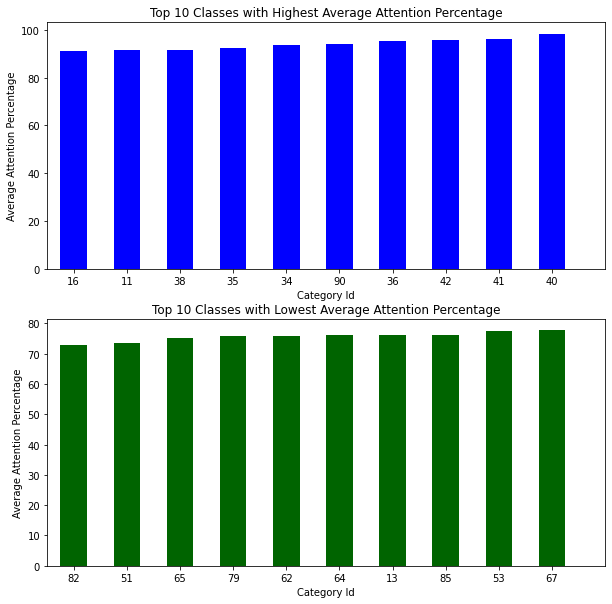

1 -> person
2 -> bicycle
3 -> car
4 -> motorcycle
5 -> airplane
6 -> bus
7 -> train
8 -> truck
9 -> boat
10 -> traffic light
11 -> fire hydrant
13 -> stop sign
14 -> parking meter
15 -> bench
16 -> bird
17 -> cat
18 -> dog
19 -> horse
20 -> sheep
21 -> cow
22 -> elephant
23 -> bear
24 -> zebra
25 -> giraffe
27 -> backpack
28 -> umbrella
31 -> handbag
32 -> tie
33 -> suitcase
34 -> frisbee
35 -> skis
36 -> snowboard
37 -> sports ball
38 -> kite
39 -> baseball bat
40 -> baseball glove
41 -> skateboard
42 -> surfboard
43 -> tennis racket
44 -> bottle
46 -> wine glass
47 -> cup
48 -> fork
49 -> knife
50 -> spoon
51 -> bowl
52 -> banana
53 -> apple
54 -> sandwich
55 -> orange
56 -> broccoli
57 -> carrot
58 -> hot dog
59 -> pizza
60 -> donut
61 -> cake
62 -> chair
63 -> couch
64 -> potted plant
65 -> bed
67 -> dining table
70 -> toilet
72 -> tv
73 -> laptop
74 -> mouse
75 -> remote
76 -> keyboard
77 -> cell phone
78 -> microwave
79 -> oven
80 -> toaster
81 -> sink
82 -> refrigerator
84 -> bo

In [78]:


top = min(10, len(percentage_avg_attention))

plt.figure(figsize=(10,10))

y = [item[1] for item in percentage_avg_attention[-top:]]
x = [item[0] for item in percentage_avg_attention[-top:]]

y2 = [item[1] for item in percentage_avg_attention[:top]]
x2 = [item[0] for item in percentage_avg_attention[:top]]

plt.subplot(211)
plt.bar(np.arange(len(y)),y, width=0.5,tick_label=x,color='blue')
plt.xlim(-0.5,len(y))
plt.xlabel('Category Id')
plt.ylabel('Average Attention Percentage')
plt.title('Top '+str(top)+' Classes with Highest Average Attention Percentage')


plt.subplot(212)
plt.bar(np.arange(len(y2)),y2, width=0.5,tick_label=x2,color='darkgreen')
plt.xlim(-0.5,len(y2))
plt.xlabel('Category Id')
plt.ylabel('Average Attention Percentage')
plt.title('Top '+str(top)+' Classes with Lowest Average Attention Percentage')
plt.show()

categ_map = {x['id']: x['name'] for x in root['categories']}
for k in categ_map.keys():
    print(k,'->',categ_map[k])



In [81]:
caption['annotations'][0]

{'caption': 'A bicycle replica with a clock as the front wheel.',
 'id': 37,
 'image_id': 203564}

In [84]:
len(caption['annotations'])

202654

In [121]:
word_occurance_in_caption = {}

for ob in tqdm(caption['annotations']): # no of words in a sentence
  sent = ob['caption'].split(' ')
  # print(sent)
  for word in sent:
    for key in word_association_dict.keys():
      # print(word, class_word , word in class_word )
      if word in word_association_dict[key]:
        # print(cat, word, class_word)
        if key in word_occurance_in_caption.keys():
          word_occurance_in_caption[key] += 1
        else:
            word_occurance_in_caption[key] = 1
        # print(word_occurance_in_caption[key])






  0%|          | 0/202654 [00:00<?, ?it/s]


  0%|          | 709/202654 [00:00<00:28, 7081.68it/s]


  1%|          | 1405/202654 [00:00<00:28, 7044.31it/s]


  1%|          | 2044/202654 [00:00<00:29, 6833.96it/s]


  1%|▏         | 2727/202654 [00:00<00:29, 6830.10it/s]


  2%|▏         | 3405/202654 [00:00<00:29, 6813.74it/s]


  2%|▏         | 4089/202654 [00:00<00:29, 6820.03it/s]


  2%|▏         | 4727/202654 [00:00<00:29, 6680.45it/s]


  3%|▎         | 5355/202654 [00:00<00:30, 6554.36it/s]


  3%|▎         | 5971/202654 [00:00<00:31, 6323.83it/s]


  3%|▎         | 6641/202654 [00:01<00:30, 6430.87it/s]


  4%|▎         | 7349/202654 [00:01<00:29, 6612.55it/s]


  4%|▍         | 8049/202654 [00:01<00:28, 6723.92it/s]


  4%|▍         | 8728/202654 [00:01<00:28, 6742.25it/s]


  5%|▍         | 9427/202654 [00:01<00:28, 6811.83it/s]


  5%|▌         | 10133/202654 [00:01<00:27, 6883.50it/s]


  5%|▌         | 10820/202654 [00:01<00:28, 6834.24it/s]


  6%|▌         | 11505/

In [152]:
word_occurance_in_caption[80] , per_avg_attention_dict[80]

KeyError: ignored

In [138]:
word_cnt_tuple_list = []
for key in word_occurance_in_caption.keys():
  a = key
  b = word_occurance_in_caption[key]
  word_cnt_tuple_list.append((a,b))

# word_cnt_tuple_list.append((80,0))
word_cnt_tuple_list = sorted(word_cnt_tuple_list, key = lambda x: x[1])


In [148]:
word_cnt_tuple_list , len(word_cnt_tuple_list)

([(89, 6),
  (50, 273),
  (80, 326),
  (14, 386),
  (74, 426),
  (48, 442),
  (87, 445),
  (49, 495),
  (90, 573),
  (78, 656),
  (76, 686),
  (84, 754),
  (79, 880),
  (40, 980),
  (75, 995),
  (36, 1010),
  (82, 1043),
  (32, 1221),
  (39, 1302),
  (11, 1429),
  (34, 1472),
  (33, 1607),
  (53, 1663),
  (31, 1666),
  (81, 1693),
  (63, 1752),
  (27, 1867),
  (9, 1915),
  (2, 1935),
  (54, 1945),
  (86, 1992),
  (72, 2007),
  (58, 2043),
  (47, 2273),
  (88, 2295),
  (38, 2338),
  (28, 2397),
  (62, 2465),
  (8, 2587),
  (52, 2634),
  (61, 2712),
  (42, 2979),
  (55, 3130),
  (20, 3196),
  (16, 3261),
  (64, 3265),
  (51, 3307),
  (41, 3340),
  (3, 3427),
  (21, 3550),
  (5, 3579),
  (46, 3631),
  (65, 3670),
  (15, 3721),
  (77, 3838),
  (85, 3954),
  (6, 4110),
  (24, 4238),
  (44, 4290),
  (22, 4515),
  (23, 4666),
  (35, 4674),
  (4, 4830),
  (25, 5050),
  (19, 5247),
  (13, 5349),
  (60, 5438),
  (57, 5518),
  (73, 5625),
  (56, 5907),
  (7, 6666),
  (67, 7301),
  (43, 7680),
  (

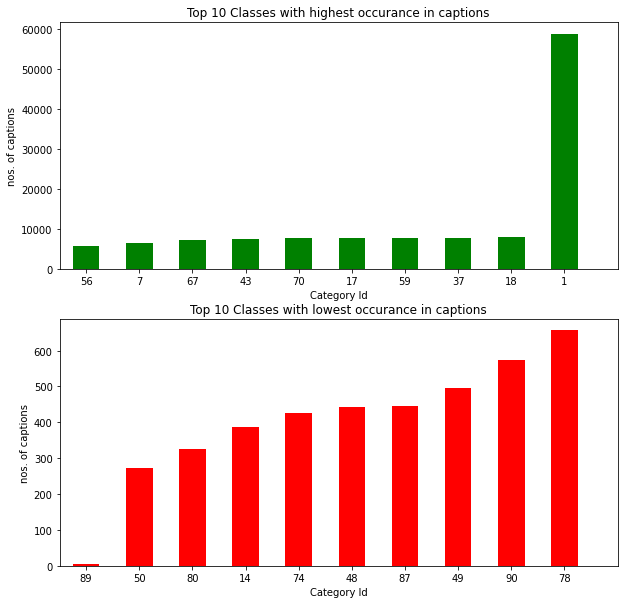

1 -> person
2 -> bicycle
3 -> car
4 -> motorcycle
5 -> airplane
6 -> bus
7 -> train
8 -> truck
9 -> boat
10 -> traffic light
11 -> fire hydrant
13 -> stop sign
14 -> parking meter
15 -> bench
16 -> bird
17 -> cat
18 -> dog
19 -> horse
20 -> sheep
21 -> cow
22 -> elephant
23 -> bear
24 -> zebra
25 -> giraffe
27 -> backpack
28 -> umbrella
31 -> handbag
32 -> tie
33 -> suitcase
34 -> frisbee
35 -> skis
36 -> snowboard
37 -> sports ball
38 -> kite
39 -> baseball bat
40 -> baseball glove
41 -> skateboard
42 -> surfboard
43 -> tennis racket
44 -> bottle
46 -> wine glass
47 -> cup
48 -> fork
49 -> knife
50 -> spoon
51 -> bowl
52 -> banana
53 -> apple
54 -> sandwich
55 -> orange
56 -> broccoli
57 -> carrot
58 -> hot dog
59 -> pizza
60 -> donut
61 -> cake
62 -> chair
63 -> couch
64 -> potted plant
65 -> bed
67 -> dining table
70 -> toilet
72 -> tv
73 -> laptop
74 -> mouse
75 -> remote
76 -> keyboard
77 -> cell phone
78 -> microwave
79 -> oven
80 -> toaster
81 -> sink
82 -> refrigerator
84 -> bo

In [140]:
top = min(10, len(word_cnt_tuple_list))

plt.figure(figsize=(10,10))

y = [item[1] for item in word_cnt_tuple_list[-top:]]
x = [item[0] for item in word_cnt_tuple_list[-top:]]

y2 = [item[1] for item in word_cnt_tuple_list[:top]]
x2 = [item[0] for item in word_cnt_tuple_list[:top]]

plt.subplot(211)
plt.bar(np.arange(len(y)),y, width=0.5,tick_label=x,color='green')
plt.xlim(-0.5,len(y))
plt.xlabel('Category Id')
plt.ylabel('nos. of captions')
plt.title('Top '+str(top)+' Classes with highest occurance in captions')


plt.subplot(212)
plt.bar(np.arange(len(y2)),y2, width=0.5,tick_label=x2,color='red')
plt.xlim(-0.5,len(y2))
plt.xlabel('Category Id')
plt.ylabel('nos. of captions')
plt.title('Top '+str(top)+' Classes with lowest occurance in captions')
plt.show()


categ_map = {x['id']: x['name'] for x in root['categories']}
for k in categ_map.keys():
    print(k,'->',categ_map[k])



In [162]:
avg_caption_attention = []

for key in per_avg_attention_dict.keys():
  a = key
  # print(a)
  # if(a in )
  b = int ( (per_avg_attention_dict[key]/100) * word_occurance_in_caption[key] )
  avg_caption_attention.append( (a,b) )

avg_caption_attention = sorted(avg_caption_attention, key = lambda x: x[1])

In [163]:
avg_caption_attention

[(50, 236),
 (14, 320),
 (74, 357),
 (48, 362),
 (87, 393),
 (49, 420),
 (78, 536),
 (90, 538),
 (76, 560),
 (84, 591),
 (79, 666),
 (82, 760),
 (75, 898),
 (36, 962),
 (40, 962),
 (32, 1102),
 (39, 1128),
 (53, 1290),
 (33, 1297),
 (11, 1308),
 (31, 1324),
 (34, 1379),
 (63, 1391),
 (81, 1472),
 (27, 1564),
 (54, 1669),
 (86, 1672),
 (9, 1684),
 (72, 1711),
 (58, 1744),
 (2, 1748),
 (62, 1872),
 (47, 1878),
 (88, 1934),
 (28, 2140),
 (38, 2142),
 (52, 2167),
 (8, 2210),
 (61, 2411),
 (51, 2435),
 (55, 2472),
 (64, 2482),
 (3, 2760),
 (65, 2761),
 (42, 2844),
 (20, 2868),
 (16, 2968),
 (85, 3010),
 (21, 3068),
 (5, 3096),
 (15, 3143),
 (46, 3192),
 (41, 3207),
 (44, 3391),
 (77, 3464),
 (24, 3472),
 (6, 3509),
 (22, 3789),
 (23, 4061),
 (13, 4070),
 (4, 4198),
 (25, 4306),
 (35, 4306),
 (19, 4549),
 (56, 4710),
 (60, 4711),
 (57, 4728),
 (73, 4834),
 (7, 5191),
 (67, 5665),
 (59, 6212),
 (43, 6259),
 (37, 6336),
 (70, 6516),
 (17, 6549),
 (18, 6905),
 (1, 49313)]

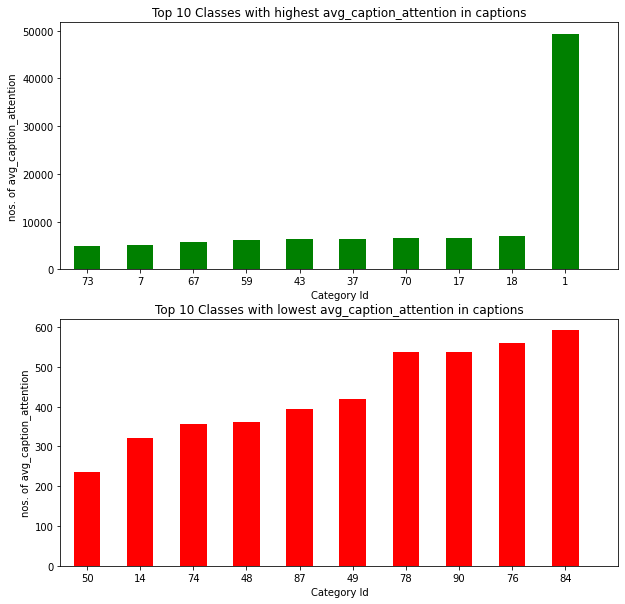

1 -> person
2 -> bicycle
3 -> car
4 -> motorcycle
5 -> airplane
6 -> bus
7 -> train
8 -> truck
9 -> boat
10 -> traffic light
11 -> fire hydrant
13 -> stop sign
14 -> parking meter
15 -> bench
16 -> bird
17 -> cat
18 -> dog
19 -> horse
20 -> sheep
21 -> cow
22 -> elephant
23 -> bear
24 -> zebra
25 -> giraffe
27 -> backpack
28 -> umbrella
31 -> handbag
32 -> tie
33 -> suitcase
34 -> frisbee
35 -> skis
36 -> snowboard
37 -> sports ball
38 -> kite
39 -> baseball bat
40 -> baseball glove
41 -> skateboard
42 -> surfboard
43 -> tennis racket
44 -> bottle
46 -> wine glass
47 -> cup
48 -> fork
49 -> knife
50 -> spoon
51 -> bowl
52 -> banana
53 -> apple
54 -> sandwich
55 -> orange
56 -> broccoli
57 -> carrot
58 -> hot dog
59 -> pizza
60 -> donut
61 -> cake
62 -> chair
63 -> couch
64 -> potted plant
65 -> bed
67 -> dining table
70 -> toilet
72 -> tv
73 -> laptop
74 -> mouse
75 -> remote
76 -> keyboard
77 -> cell phone
78 -> microwave
79 -> oven
80 -> toaster
81 -> sink
82 -> refrigerator
84 -> bo

In [161]:
top = min(10, len(avg_caption_attention))

plt.figure(figsize=(10,10))

y = [item[1] for item in avg_caption_attention[-top:]]
x = [item[0] for item in avg_caption_attention[-top:]]

y2 = [item[1] for item in avg_caption_attention[:top]]
x2 = [item[0] for item in avg_caption_attention[:top]]

plt.subplot(211)
plt.bar(np.arange(len(y)),y, width=0.5,tick_label=x,color='green')
plt.xlim(-0.5,len(y))
plt.xlabel('Category Id')
plt.ylabel('nos. of avg_caption_attention')
plt.title('Top '+str(top)+' Classes with highest avg_caption_attention in captions')


plt.subplot(212)
plt.bar(np.arange(len(y2)),y2, width=0.5,tick_label=x2,color='red')
plt.xlim(-0.5,len(y2))
plt.xlabel('Category Id')
plt.ylabel('nos. of avg_caption_attention')
plt.title('Top '+str(top)+' Classes with lowest avg_caption_attention in captions')
plt.show()


categ_map = {x['id']: x['name'] for x in root['categories']}
for k in categ_map.keys():
    print(k,'->',categ_map[k])



In [ ]:
def stack_plot(data, xtick, col2, col3): #col 2 is pred, col 3 is total
  ind = np.arange(data.shape[0])
  plt.figure(figsize=(20,5))
  p1 = plt.bar(ind, data[col3].values)
  p2 = plt.bar(ind, data[col2].values)
  plt.ylabel('Nos. of captions')
  plt.title('Captions with successful attention')
  plt.xticks(ind, list(data[xtick].values))
  plt.legend((p1[0], p2[0]), ('total', 'accepted'))
  plt.show()

In [167]:
cat = []
tot_cap = []
att_cap = []
for k in per_avg_attention_dict.keys():
  cat.append(k)
  tot_cap.append(word_occurance_in_caption[k])
  att_cap.append( int ( (per_avg_attention_dict[k]/100)*word_occurance_in_caption[k]) )

In [168]:
tot_cap[0], att_cap[0]

(4830, 4198)

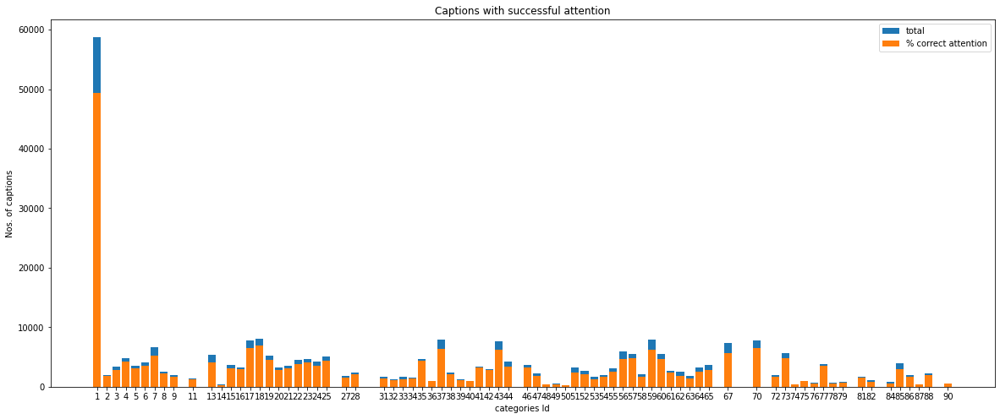

1 -> person
2 -> bicycle
3 -> car
4 -> motorcycle
5 -> airplane
6 -> bus
7 -> train
8 -> truck
9 -> boat
10 -> traffic light
11 -> fire hydrant
13 -> stop sign
14 -> parking meter
15 -> bench
16 -> bird
17 -> cat
18 -> dog
19 -> horse
20 -> sheep
21 -> cow
22 -> elephant
23 -> bear
24 -> zebra
25 -> giraffe
27 -> backpack
28 -> umbrella
31 -> handbag
32 -> tie
33 -> suitcase
34 -> frisbee
35 -> skis
36 -> snowboard
37 -> sports ball
38 -> kite
39 -> baseball bat
40 -> baseball glove
41 -> skateboard
42 -> surfboard
43 -> tennis racket
44 -> bottle
46 -> wine glass
47 -> cup
48 -> fork
49 -> knife
50 -> spoon
51 -> bowl
52 -> banana
53 -> apple
54 -> sandwich
55 -> orange
56 -> broccoli
57 -> carrot
58 -> hot dog
59 -> pizza
60 -> donut
61 -> cake
62 -> chair
63 -> couch
64 -> potted plant
65 -> bed
67 -> dining table
70 -> toilet
72 -> tv
73 -> laptop
74 -> mouse
75 -> remote
76 -> keyboard
77 -> cell phone
78 -> microwave
79 -> oven
80 -> toaster
81 -> sink
82 -> refrigerator
84 -> bo

In [174]:
ind = cat
plt.figure(figsize=(20,8))
p1 = plt.bar(ind, tot_cap)
p2 = plt.bar(ind, att_cap)
plt.ylabel('Nos. of captions')
plt.xlabel('categories Id')
plt.title('Captions with successful attention')
plt.xticks(ind, cat)
plt.legend((p1[0], p2[0]), ('total', '% correct attention'))
plt.show()

for k in categ_map.keys():
    print(k,'->',categ_map[k])